# Imports

In [1]:
from matplotlib import pyplot as plt
import numpy as np
from module import Nugget, save_nugget_file, load_nugget_file, bisection, loop_bisection, convert_dictionary, load_dictionary, trim_dictionary
import physics
import plotting

# Creating a nugget

Nugget has 5857 zones.
Radius array: [1.00000000e-06 1.00500000e-06 1.01000000e-06 ... 9.42175283e+06
 9.58796635e+06 9.75417988e+06]

nugget has a photosphere?: True

log10(L_ratio) = 0.547422241476713

log10(L_ratio) = 0.547422241476713 after loading


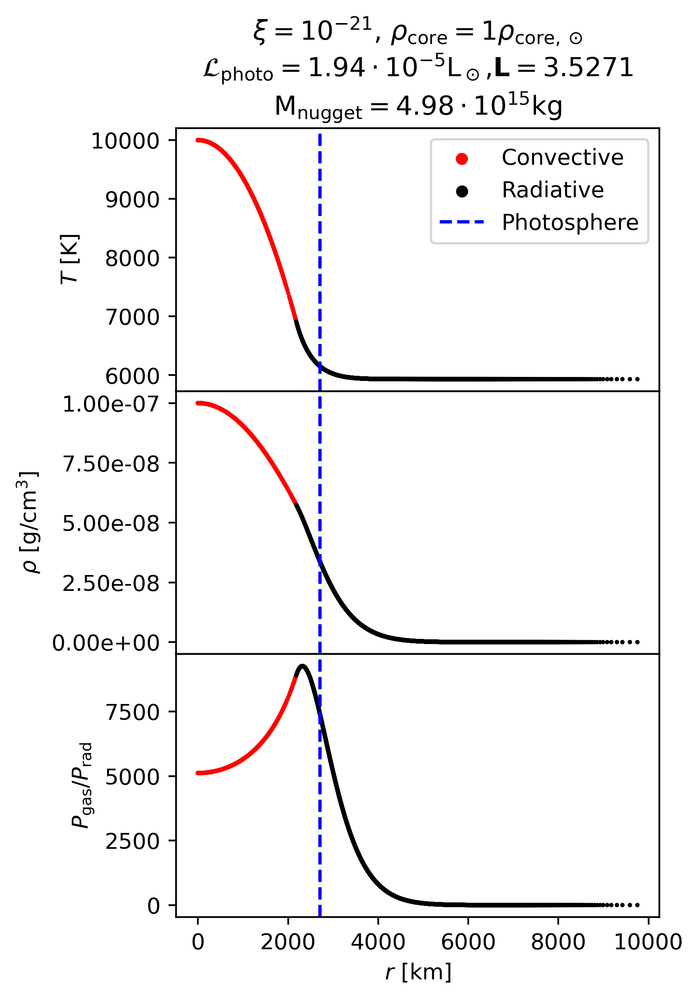

In [2]:
# Choose the initial conditions for the nugget
rho_c_MS_frac   = 1     # in units of rho_c_sun
xi              = 1e-21 # Typically 1e-28 to 1e-14 range
rho_c           = 1e-4  # in SI units (kg/m^3)
T_c             = 1e4   # in kelvin
nugget = Nugget(rho_c_MS_frac, xi, rho_c, T_c, solver_tol=1e-5)

# Show some properties of the nugget
print(f'Nugget has {len(nugget.r())} zones.')
print(f'Radius array: {nugget.r()}')
print(f'\nnugget has a photosphere?: {nugget.has_photosphere()}')
print(f'\nlog10(L_ratio) = {nugget.log_L_ratio()}')

# We can save/load the nugget to a file (uses the pickle package)
path = 'examples/single.nugget'
save_nugget_file(path, nugget)
nugget_loaded = load_nugget_file(path)
print(f'\nlog10(L_ratio) = {nugget.log_L_ratio()} after loading')

# Make a plot of the nugget like one in the paper
if nugget.has_photosphere():
    plotting.plot_nugget_paper(nugget)

# Input parameter space

This part isn't necessary, but might be good to understand the reasoning behind using bisection 

In [5]:
def save_nugget_grid(rho_c_MS_frac, xi, rho_points, T_points, filepath = None, solver_tol=1e-5):
    nuggets = []
    for i, rho_c in enumerate(rho_points):
        for j, T_c in enumerate(T_points):
            print(f'{i+1}/{len(rho_points)} rho_c = {rho_c:.3e},  {j+1}/{len(T_points)} T_c = {T_c:.3e}', end = '\r')
            nuggets.append(Nugget(rho_c_MS_frac, xi, rho_c, T_c, solver_tol))

    if filepath is not None: save_nugget_file(filepath, nuggets)
    return nuggets

# Chose two parameters
rho_c_MS_frac = 1
xi = 1e-21

# Choose how many points to make
n_T = 30
n_rho = 30

rho_points = np.geomspace(1e-10, 1e-1, n_T) * 1000
T_points = np.geomspace(1e2, 1e8, n_rho)
num_nuggets = n_T * n_rho
print(f'Estimated time to run, with 1 nugget = 0.3s, is {0.3*num_nuggets/60:.2f}min') #Based on my laptop with the given solver_tol

# Choose where to save the file
filepath_input_grid = 'examples/grid.nuggets'

# Use this to generate the nuggets file
nuggets = save_nugget_grid(rho_c_MS_frac, xi, rho_points, T_points, filepath_input_grid, solver_tol=2e-4)

Estimated time to run, with 1 nugget = 0.3s, is 4.50min


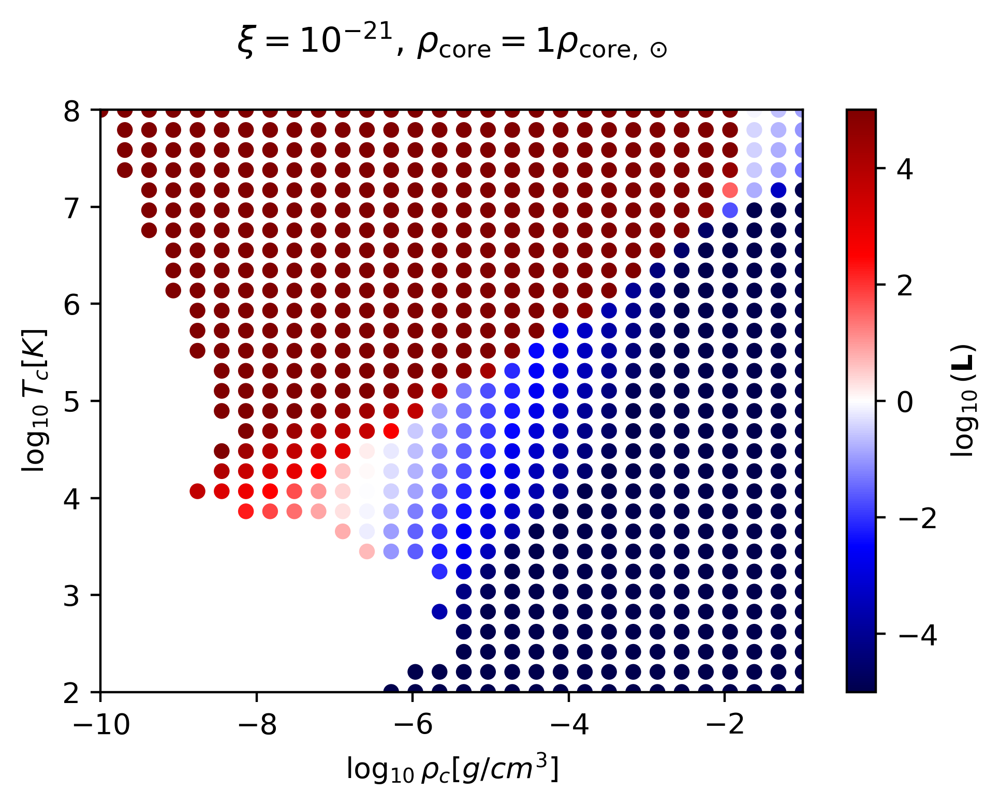

In [6]:
nuggets = load_nugget_file(filepath_input_grid)
plotting.plot_inputspace(nuggets)

# Introduce Bisection

In [7]:
rho_c_MS_frac = 1
xi = 1e-21
T_c = 8e3
L_ratio_error = 0.01

# Do bisection method on rho_c to find the correct value
# This can take up to a minute to run depending on rho_c_MS, xi, and T_c with this solver_tol & L_ratio_error 
final_nugget, bisection_nuggets, successful = bisection(rho_c_MS_frac, xi, T_c, L_ratio_error, solver_tol=1e-4)
if successful: print(f'L_photo/L_heating = {final_nugget.L_ratio():.8f}')

L_photo/L_heating = 0.99991197


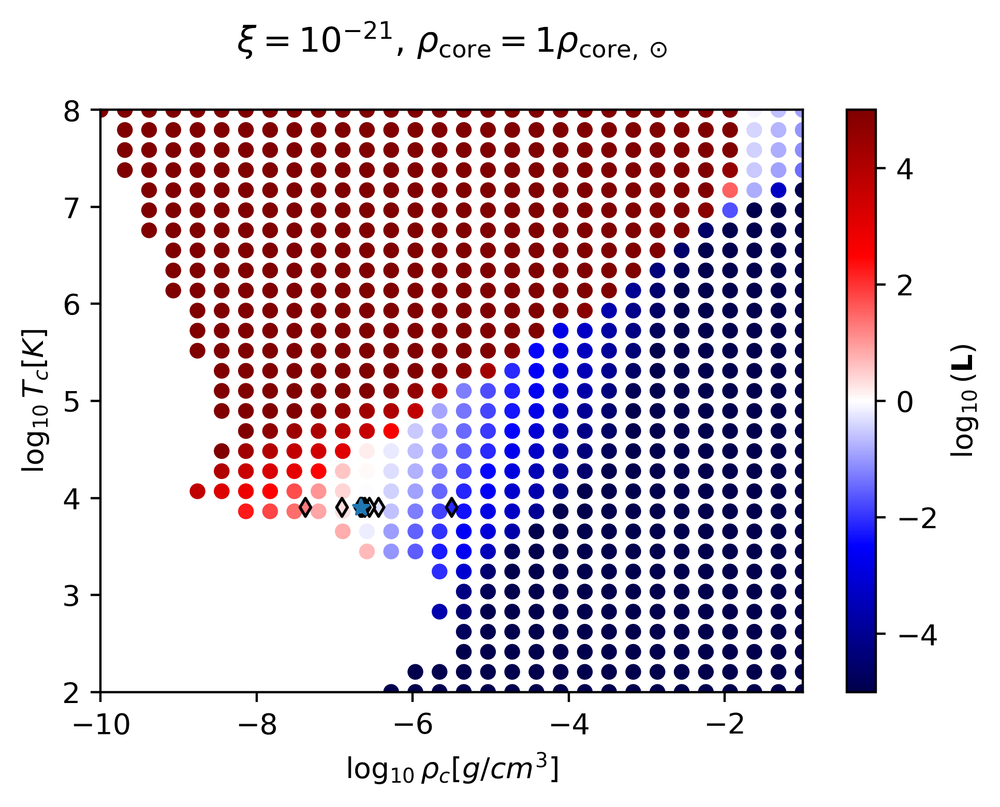

In [8]:
# Show the bisection method's progress on the input parameter space from earlier
filepath_input_grid = 'examples/grid.nuggets'
nuggets = load_nugget_file(filepath_input_grid)
plotting.plot_inputspace(nuggets)
bisection_values = np.transpose([[np.log10(n.rho_c(True)), np.log10(n.T_c()), n.log_L_ratio()] for n in bisection_nuggets])
plt.scatter(bisection_values[0], bisection_values[1], c = bisection_values[2], vmin=-5, vmax=5, cmap='seismic', marker='d', edgecolor='k', s=20)
plt.scatter(np.log10(final_nugget.rho_c(True)), np.log10(final_nugget.T_c()), marker = '*', s=30)
plt.show()

# Physical Parameter Space

In [ ]:
# Now we repeat this process over a loop of rho_c_MS, xi, T_c to build up the physical parameter space plot.
# Here I've reduced the parameters to make it run in a more reasonable time. This cell takes ~9 mins to run on my laptop.
rho_c_MS_fracs = [1, 10]    # Usually [1e-5, 0.01, 0.1, 1.0, 10.0, 100.0, 1e5]
xis = [1e-22, 1e-18]        # Usually np.logspace(-26, -16, 21)
T_cs = np.logspace(2,8, 8)  # Usually with 60-70 points 
L_ratio_error = 0.05        # Usually 0.001 (0.1%) 
solver_tol = 1e-4           # Usually 1e-5 (default parameter)

good_nuggets = loop_bisection(rho_c_MS_fracs, xis, T_cs, L_ratio_error, solver_tol=solver_tol)

# The result should be the same as what is contained in the file I load below. 
# If you want to skip the wait, comment out the bisection call and use the saved data instead.

# good_nuggets = load_nugget_file('examples/small_bisection.nuggets')

['9.272e-07', '1.066e-04', '5.461e-02', '4.904e+01', '6.215e+04', '1.412e-02', '1.796e+01', '1.235e+05', '1.957e-05', '1.702e-02', '1.561e+01', '1.949e+04', '5.788e+00', '3.986e+04']
['9.272e-07', '1.066e-04', '5.461e-02', '4.904e+01', '6.215e+04', '1.586e+09', '1.412e-02', '1.796e+01', '1.235e+05', '1.311e+10', '1.591e+15', '8.049e-08', '1.957e-05', '1.702e-02', '1.561e+01', '1.949e+04', '5.967e+08', '2.727e-03', '5.788e+00', '3.986e+04', '4.203e+09', '5.802e+14']

['2.442e+01', '9.848e+04', '1.190e+05', '2.716e+06', '1.917e+08', '1.821e+01', '5.364e+02', '4.727e+04', '1.067e+04', '3.763e+04', '8.588e+05', '6.059e+07', '1.686e+02', '1.458e+04']
['2.442e+01', '9.848e+04', '1.190e+05', '2.716e+06', '1.917e+08', '1.663e+10', '1.821e+01', '5.364e+02', '4.727e+04', '2.674e+06', '1.645e+08', '6.744e+00', '1.067e+04', '3.763e+04', '8.588e+05', '6.059e+07', '4.511e+09', '5.275e+00', '1.686e+02', '1.458e+04', '8.384e+05', '4.492e+07']


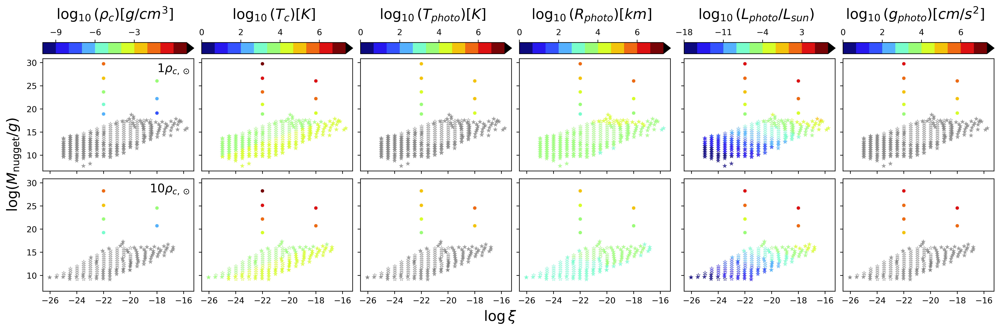

In [16]:
# First we trim the nuggets we found to have high total optical depth (so they aren't thin) and reasonable luminosity
trimmed_nuggets = [n for n in good_nuggets if (n.total_tau() > 10) and (n.L_photo() <= 1e7*physics.L_sun)]
print([f'{n.L_photo()/physics.L_sun:.3e}' for n in trimmed_nuggets])
print([f'{n.L_photo()/physics.L_sun:.3e}' for n in good_nuggets])
print()
print([f'{n.total_tau():.3e}' for n in trimmed_nuggets])
print([f'{n.total_tau():.3e}' for n in good_nuggets])

# Here we convert the simple list of nuggets we generated into a dictionary structure that is used in plotting the parameter space
contour_dict = convert_dictionary(trimmed_nuggets)


# Now we can make the parameter space plot used in the paper.
cbar_ranges = [(-10, 1), (0, 7+1/3), (0, 7+1/3), (0, 7+1/3), (-18,7+2/3), (0, 7+1/3)]               # These are also the default values
ticks = [np.linspace(-18, -3, 6), [0,2,4,6], [0,2,4,6], [0,2,4,6], [-18, -11, -4, 3], [0,2,4,6]]    # These are also the default values
plotting.plot_paramspace(contour_dict, cbar_ranges=cbar_ranges, cbar_ticks = ticks)


In [ ]:
# Here I load in the data that makes up the final parameter space plot that appears in the paper, 
# This is stored as a json file in the dictionary format used above

full_data_path = 'paramspace/contour_dict.json'
full_contour_dict = load_dictionary(full_data_path)

# We save the nugget properties before trimming them for tau, L, and M, so we have to do this afterwards
contour_dict_trimmed = trim_dictionary(full_contour_dict)

# Plot it
cbar_ranges = [(-10, 1), (0, 7+1/3), (0, 7+1/3), (0, 7+1/3), (-18,7+2/3), (0, 7+1/3)]
ticks = [np.linspace(-18, -3, 6), [0,2,4,6], [0,2,4,6], [0,2,4,6], [-18, -11, -4, 3], [0,2,4,6]]
plotting.plot_paramspace(contour_dict_trimmed, cbar_ranges=cbar_ranges, cbar_ticks = ticks, plotpath='paramspace/full_paramspace.png')